## Analysis endo

In [ ]:
# !cd /raid1/cqy/CD45-/Graduation_project

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as an
import matplotlib.pyplot as plt
import seaborn as sns
import os
from scipy.sparse import csr_matrix

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/umap/distances.py:108

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.24.3 scipy==1.10.1 pandas==1.5.0 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.4 pynndescent==0.5.10


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()


### 1. Reclustering & annotation

In [25]:
endo = sc.read_h5ad("2.BatchCorrection/endo_harmony.h5ad")
endo

AnnData object with n_obs × n_vars = 97190 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [26]:
endo_counts = sc.read_h5ad("2.BatchCorrection/endo_counts.h5ad")
endo_counts

AnnData object with n_obs × n_vars = 97190 × 16586
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'harmony', 'scanorama', 'bbknn'

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


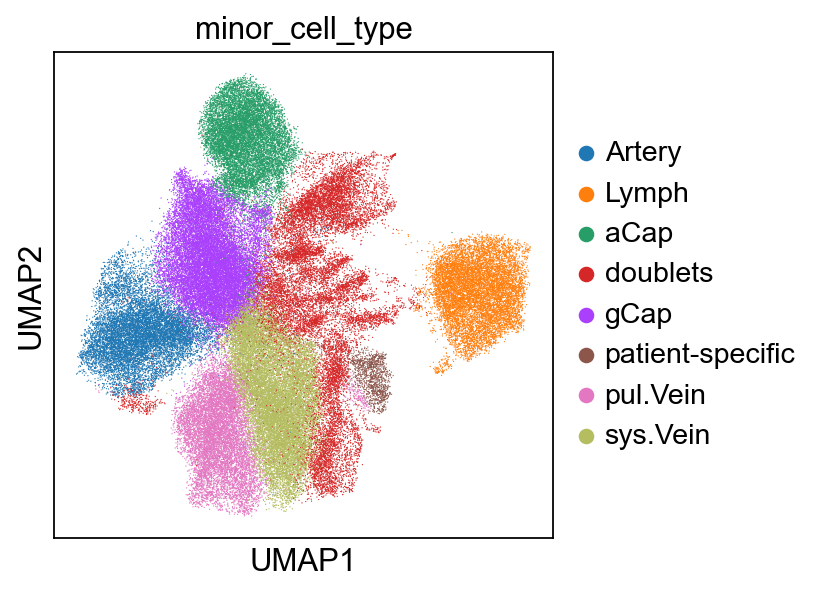

In [27]:
sc.pl.umap(endo, color = 'minor_cell_type')

In [28]:
# Remove doublets, clustering round 1
endo = endo[endo.obs["minor_cell_type"] != "doublets"]
endo

View of AnnData object with n_obs × n_vars = 80319 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [29]:
endo_counts = endo_counts[endo_counts.obs["harmony"] != "doublets"]
endo_counts

View of AnnData object with n_obs × n_vars = 80319 × 16586
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'harmony', 'scanorama', 'bbknn'

In [30]:
endo = endo.raw.to_adata()
endo

AnnData object with n_obs × n_vars = 80319 × 16586
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

In [31]:
sc.pp.highly_variable_genes(endo, min_mean = 0.0125, max_mean = 3, min_disp = 0.5, n_top_genes = 1000)
endo.raw = endo
endo = endo[:, endo.var.highly_variable]
sc.pp.scale(endo, max_value = 10)
sc.tl.pca(endo, svd_solver = 'arpack')

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:05)


In [32]:
sc.external.pp.harmony_integrate(endo, "dataset", max_iter_harmony = 30, plot_convergence = True)
endo.obsm['X_pca'] = endo.obsm['X_pca_harmony']

2024-03-23 15:37:58,793 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-03-23 15:38:18,042 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-03-23 15:38:18,440 - harmonypy - INFO - Iteration 1 of 30
2024-03-23 15:38:56,144 - harmonypy - INFO - Iteration 2 of 30
2024-03-23 15:39:36,444 - harmonypy - INFO - Converged after 2 iterations


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:05)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


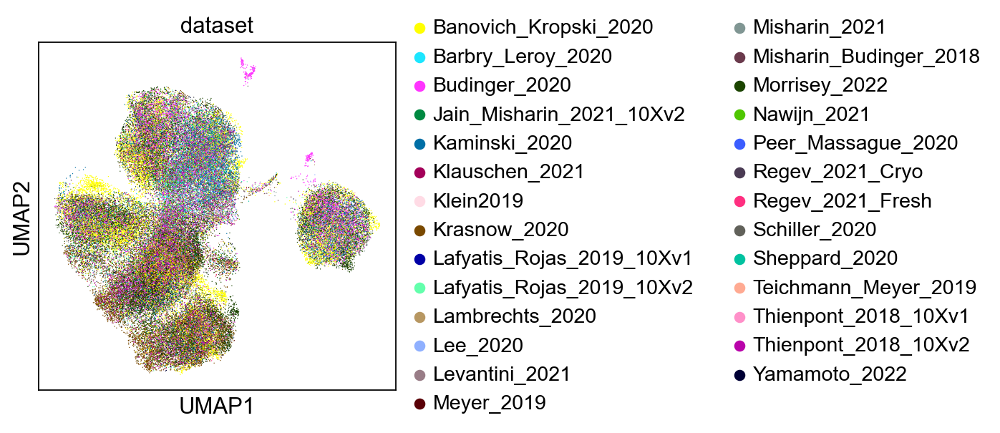

In [33]:
sc.pp.neighbors(endo, n_neighbors=10, n_pcs = 40)
sc.tl.umap(endo)
sc.pl.umap(endo, color = ["dataset"])

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


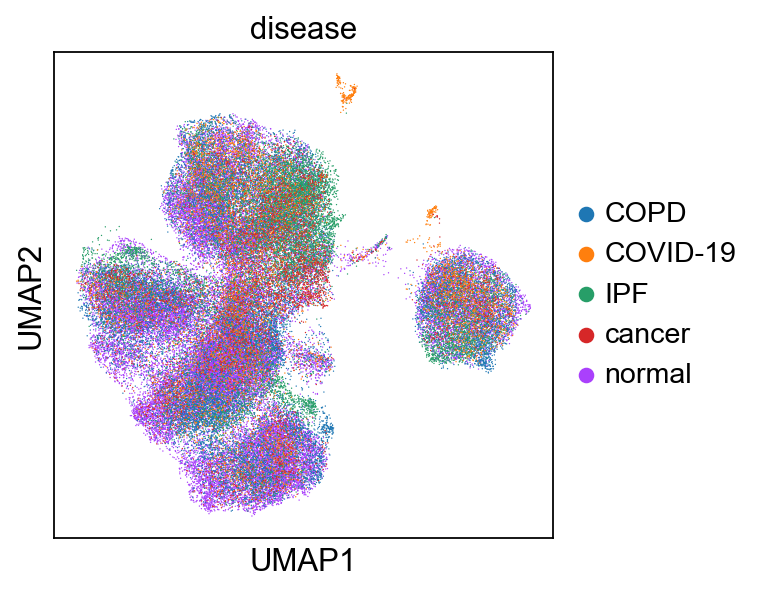

In [34]:
sc.pl.umap(endo, color = ["disease"])

running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:41)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


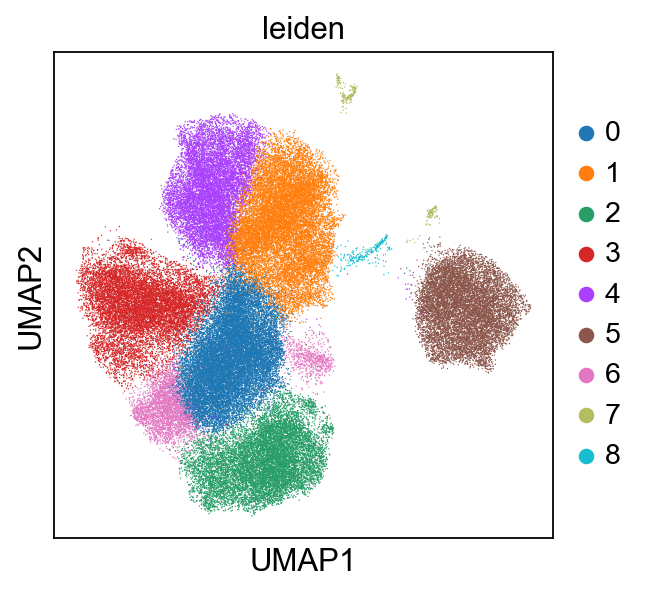

In [35]:
sc.tl.leiden(endo, resolution = 0.5)
sc.pl.umap(endo, color = "leiden")

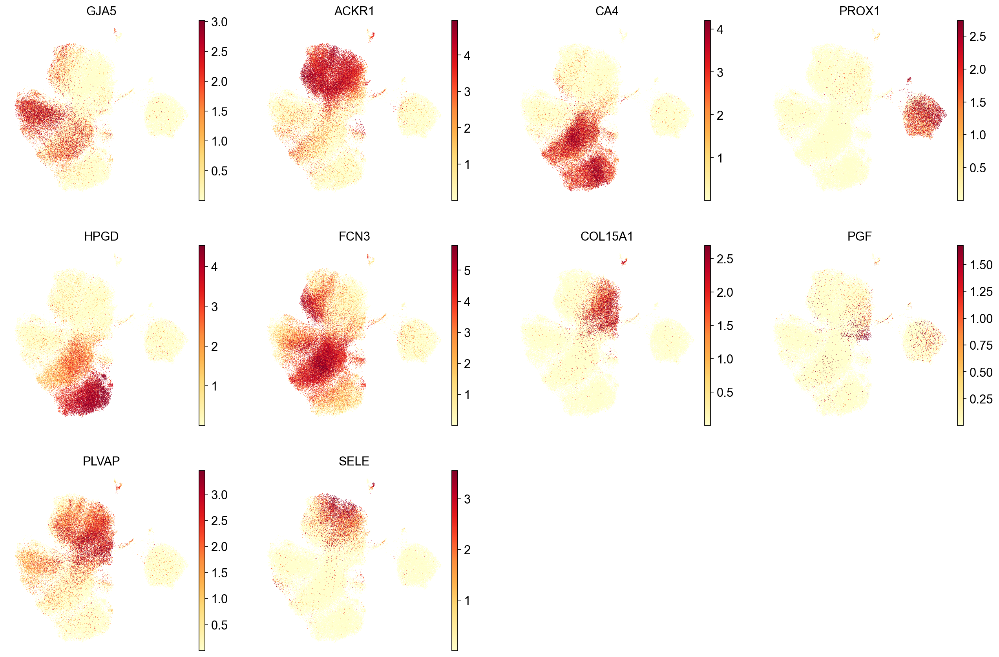

In [36]:
sc.pl.umap(endo, 
           color = ["GJA5", "ACKR1", "CA4", "PROX1", 
                    "HPGD", "FCN3", "COL15A1", "PGF",
                    "PLVAP", "SELE"],
           frameon = False,
           vmin = 0.0001,
           vmax = 'p99',
           color_map = 'YlOrRd')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:02:49)


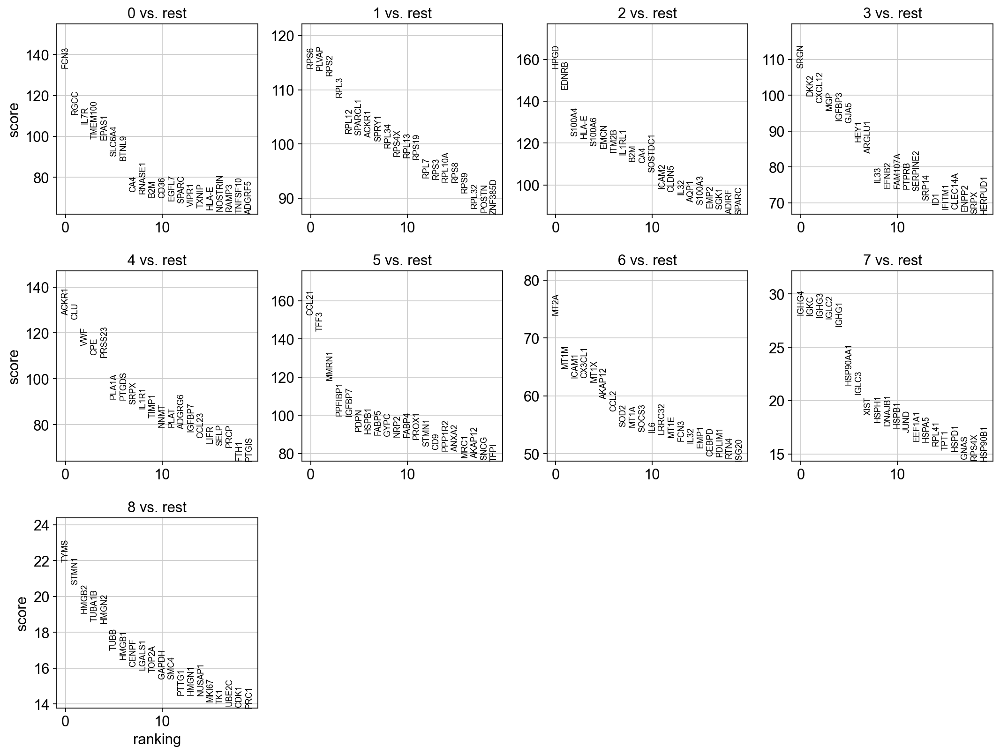

In [37]:
sc.tl.rank_genes_groups(endo, groupby = 'leiden', method = "wilcoxon")
sc.pl.rank_genes_groups(endo, sharey = False)

In [38]:
# Remove doublets, clustering round 2
endo_counts.obs["leiden"] = endo.obs["leiden"].tolist()
endo = endo[endo.obs["leiden"] != "7"]
endo_counts = endo_counts[endo_counts.obs["leiden"] != "7"]

/tmp/ipykernel_60167/3019712567.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  endo_counts.obs["leiden"] = endo.obs["leiden"].tolist()


In [39]:
endo = endo.raw.to_adata()
endo

AnnData object with n_obs × n_vars = 80050 × 16586
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

In [40]:
sc.pp.highly_variable_genes(endo, min_mean = 0.0125, max_mean = 3, min_disp = 0.5, n_top_genes = 1000)
endo.raw = endo
endo = endo[:, endo.var.highly_variable]
sc.pp.scale(endo, max_value = 10)
sc.tl.pca(endo, svd_solver = 'arpack')

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)


In [41]:
sc.external.pp.harmony_integrate(endo, "dataset", max_iter_harmony = 30, plot_convergence = True)
endo.obsm['X_pca'] = endo.obsm['X_pca_harmony']

2024-03-23 15:51:43,609 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-03-23 15:52:04,163 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-03-23 15:52:05,128 - harmonypy - INFO - Iteration 1 of 30
2024-03-23 15:52:45,932 - harmonypy - INFO - Iteration 2 of 30
2024-03-23 15:53:26,057 - harmonypy - INFO - Converged after 2 iterations


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:09)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


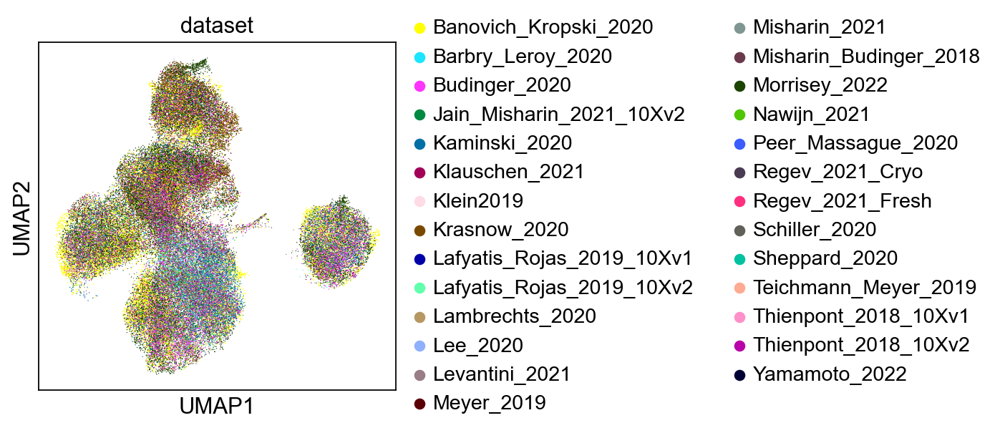

In [42]:
sc.pp.neighbors(endo, n_neighbors=10, n_pcs = 40)
sc.tl.umap(endo)
sc.pl.umap(endo, color = ["dataset"])

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


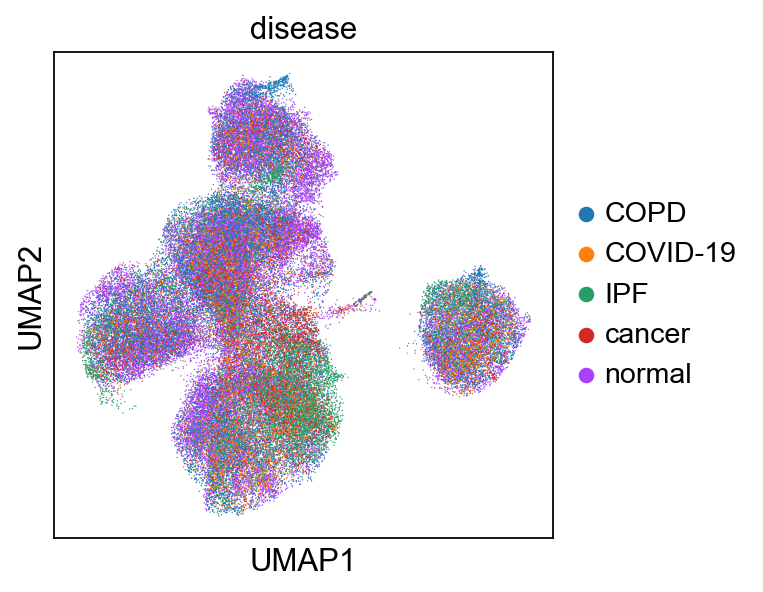

In [43]:
sc.pl.umap(endo, color = ["disease"])

running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:59)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


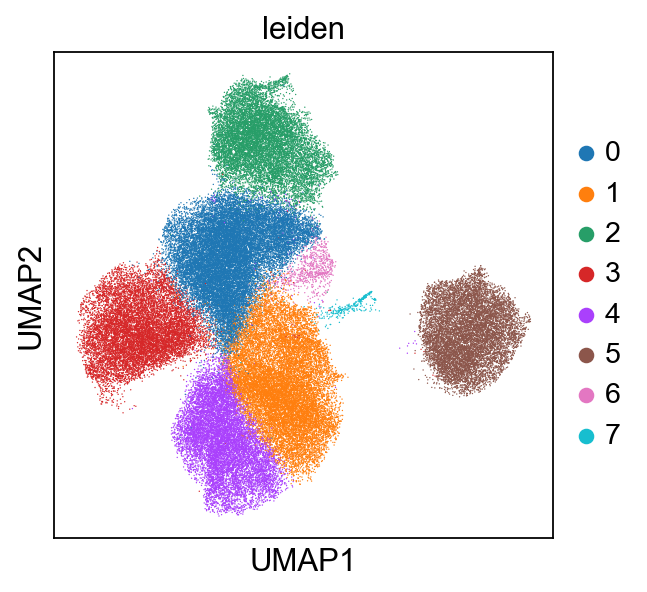

In [44]:
sc.tl.leiden(endo, resolution = 0.5)
sc.pl.umap(endo, color = "leiden")

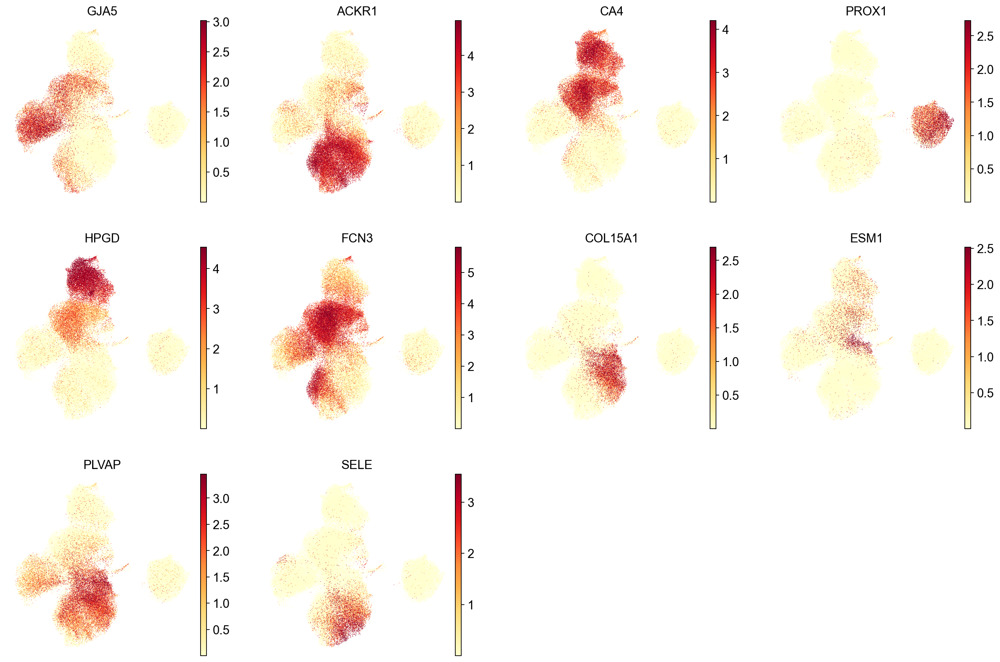

In [50]:
sc.pl.umap(endo, 
           color = ["GJA5", "ACKR1", "CA4", "PROX1", 
                    "HPGD", "FCN3", "COL15A1", "ESM1",
                    "PLVAP", "SELE"],
           frameon = False,
           vmin = 0.0001,
           vmax = 'p99',
           color_map = 'YlOrRd')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:03:08)


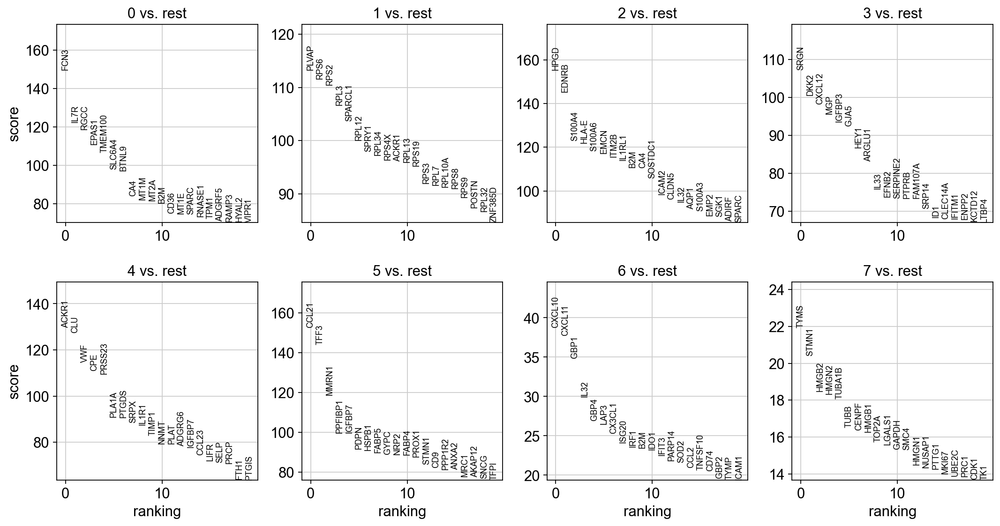

In [46]:
sc.tl.rank_genes_groups(endo, groupby = 'leiden', method = "wilcoxon")
sc.pl.rank_genes_groups(endo, sharey = False)

running Leiden clustering
    finished: found 11 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:07)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


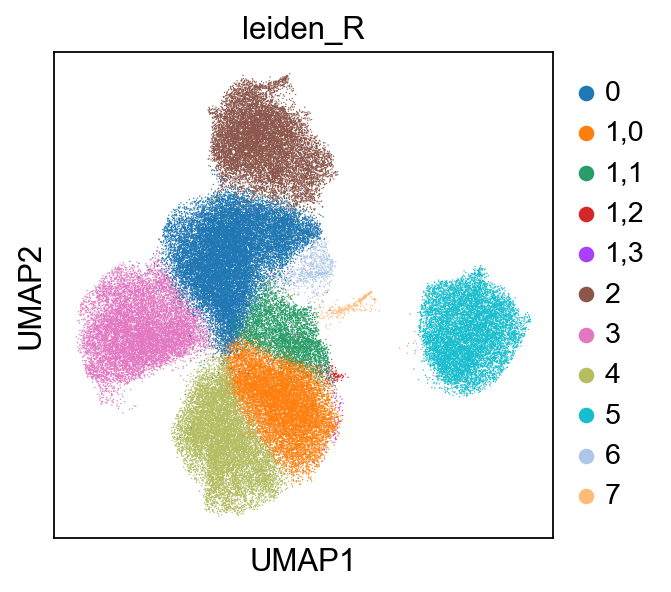

In [53]:
sc.tl.leiden(endo, restrict_to = ("leiden", ["1"]), resolution = 0.2)
sc.pl.umap(endo, color = "leiden_R")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:02:18)


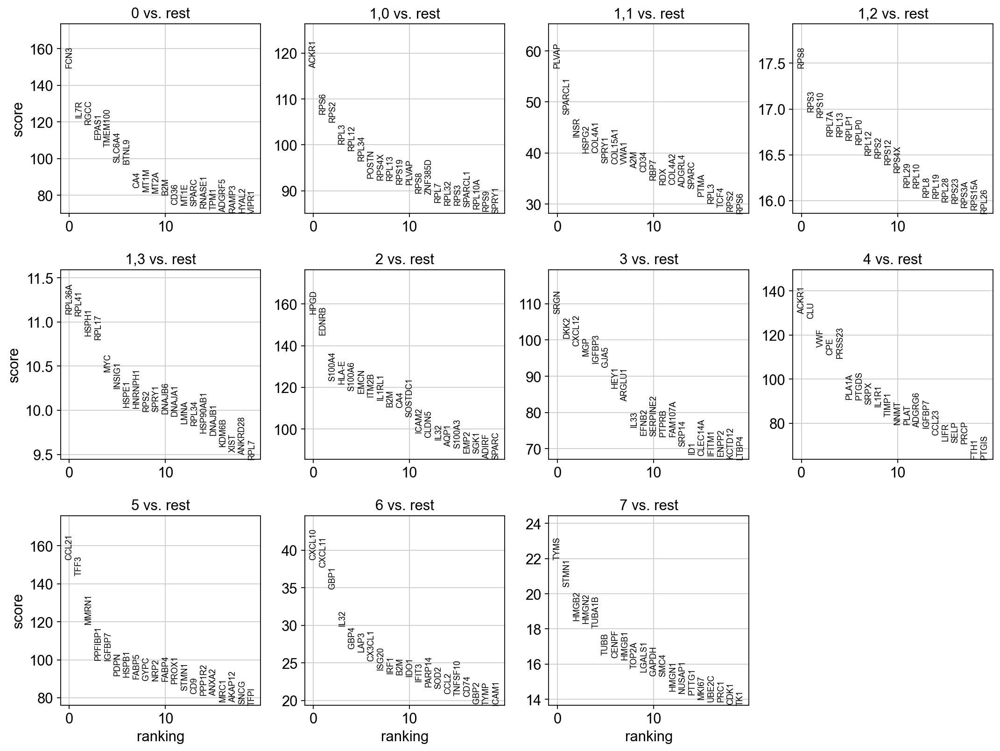

In [54]:
sc.tl.rank_genes_groups(endo, groupby = 'leiden_R', method = "wilcoxon")
sc.pl.rank_genes_groups(endo, sharey = False)

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


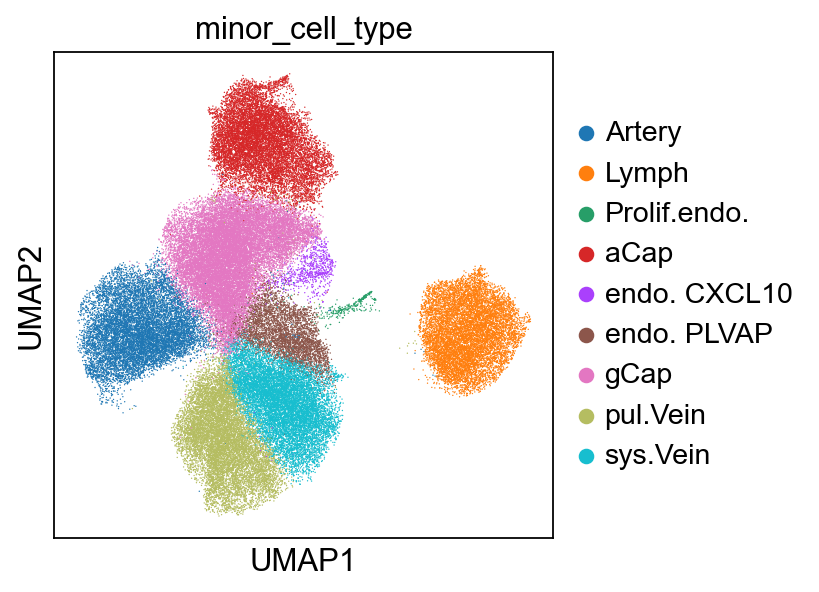

In [67]:
new_cluster_names = {
    "0": "gCap",
    "1,0": "sys.Vein",
    "1,1": "endo. PLVAP",
    "1,2": "sys.Vein",
    "1,3": "sys.Vein",
    "2": "aCap",
    "3": "Artery",
    "4": "pul.Vein",
    "5": "Lymph",
    "6": "endo. CXCL10",
    "7": "Prolif.endo.",
}
endo.obs["minor_cell_type"] = [new_cluster_names[i] for i in endo.obs["leiden_R"].tolist()]
endo_counts.obs["minor_cell_type"] = [new_cluster_names[i] for i in endo.obs["leiden_R"].tolist()]
sc.pl.umap(endo, color = ["minor_cell_type"])

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:02:58)


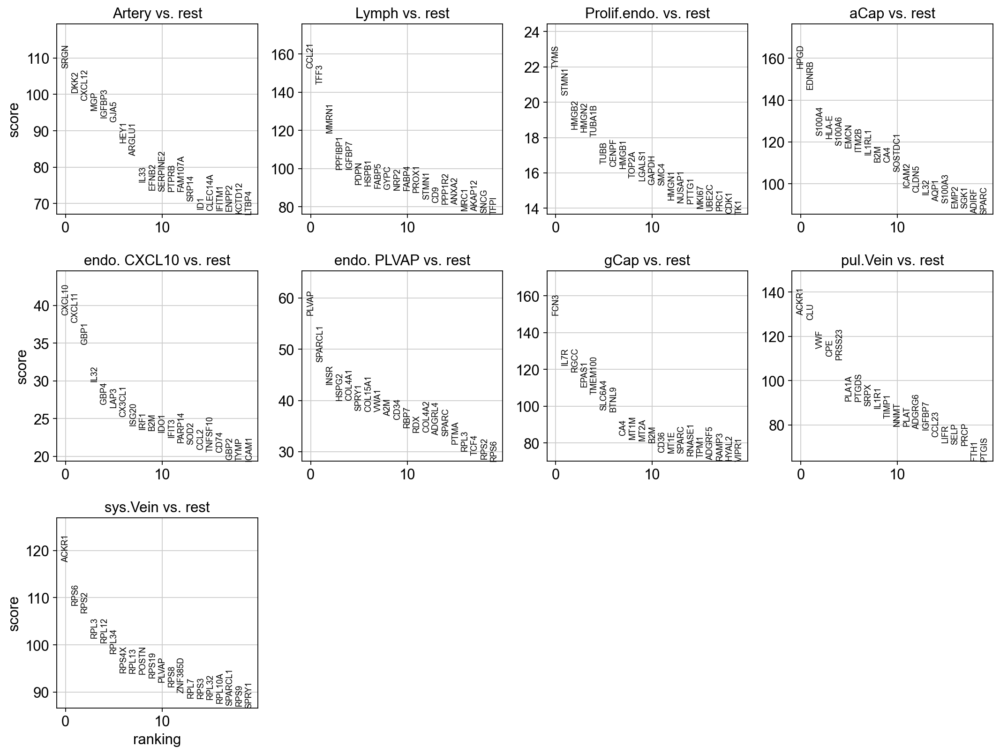

In [69]:
sc.tl.rank_genes_groups(endo, groupby = 'minor_cell_type', method = "wilcoxon")
sc.pl.rank_genes_groups(endo, sharey = False)

In [ ]:
marker = pd.DataFrame()
result = endo.uns['rank_genes_groups']
for group in endo.obs['minor_cell_type'].unique():
    new_marker = pd.DataFrame(result[key][group] for key in ['names', 'pvals_adj', 'logfoldchanges', 'scores']).transpose()
    new_marker.columns = [group + '_names', group + '_pvals_adj', group + '_logfoldchanges', group + '_scores']
    marker = pd.concat([marker, new_marker], axis = 1)
marker.to_csv("4.Endo/endo_marker.csv", index = False)
marker

In [70]:
endo.write_h5ad("4.Endo/Endo.h5ad")
endo

AnnData object with n_obs × n_vars = 80050 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety', 'leiden_R'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'leiden_R_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [71]:
endo_counts.write_h5ad("4.Endo/Endo_counts.h5ad")
endo_counts

AnnData object with n_obs × n_vars = 80050 × 16586
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'harmony', 'scanorama', 'bbknn', 'leiden', 'minor_cell_type'

In [4]:
endo = sc.read_h5ad("4.Endo/Endo.h5ad")
endo_counts = sc.read_h5ad("4.Endo/Endo_counts.h5ad")
endo.obs["dataset"] = endo.obs["dataset"].replace('Klein2019', 'Klein_2019')
endo_counts.obs["dataset"] = endo_counts.obs["dataset"].replace('Klein2019', 'Klein_2019')
endo.write_h5ad("4.Endo/Endo.h5ad")
endo_counts.write_h5ad("4.Endo/Endo_counts.h5ad")

### 2. AUCell

In [52]:
endo = sc.read_h5ad("4.Endo/Endo_aucell.h5ad")
endo

AnnData object with n_obs × n_vars = 80050 × 5
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety', 'leiden_R'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_R_colors', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'aucell_estimate'

In [53]:
endo.var_names

Index(['BIOCARTA_VEGF_PATHWAY', 'GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION',
       'GOBP_LEUKOCYTE_ADHESION_TO_VASCULAR_ENDOTHELIAL_CELL',
       'REACTOME_COLLAGEN_FORMATION', 'REACTOME_INTERFERON_SIGNALING'],
      dtype='object', name='source')

In [54]:
endo_geneset = ["VEGF pathway",
                "Antigen processing and presentation",
                "Leukocyte adhesion to vascular endo.",
                "Collagen formation",
                "Interferon signaling"]
endo.var_names = endo_geneset

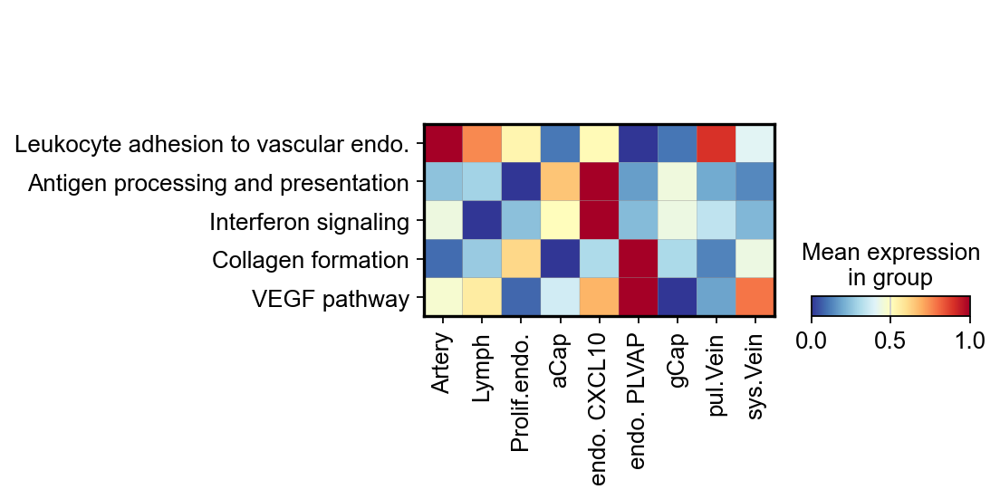

In [55]:
sc.pl.matrixplot(endo, 
                 ["Leukocyte adhesion to vascular endo.",
                  "Antigen processing and presentation",
                  "Interferon signaling",
                  "Collagen formation",
                  "VEGF pathway"],
                 groupby = "minor_cell_type", 
                 swap_axes = True,
                 standard_scale = "var",
                 cmap = "RdYlBu_r")

### 3. Disease

In [3]:
endo = sc.read_h5ad("4.Endo/Endo.h5ad")
endo

AnnData object with n_obs × n_vars = 80050 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety', 'leiden_R'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_R_colors', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

#### 3.1 R o/e

In [57]:
df = endo.obs[["cellID", "minor_cell_type", "disease"]]
grouped = df.groupby(["disease", "minor_cell_type"]).size().reset_index(name = "counts")
grouped = grouped.pivot(index='minor_cell_type', columns="disease", values="counts").fillna(0)
grouped.to_csv("4.Endo/disease_celltype.csv")
grouped

disease,COPD,COVID-19,IPF,cancer,normal
minor_cell_type,,,,,
Artery,2307,509,1345,569,6314
Lymph,2528,1071,1548,394,4271
Prolif.endo.,22,37,36,20,157
aCap,2311,581,763,477,7152
endo. CXCL10,195,66,45,50,437
endo. PLVAP,657,318,1219,779,1222
gCap,4289,1368,1419,982,12292
pul.Vein,2249,1082,1189,369,5891
sys.Vein,1474,922,4334,929,3861


In [58]:
expected = np.outer(grouped.sum(axis = 1), grouped.sum(axis = 0)) / grouped.sum().sum()
expected = pd.DataFrame(expected, index = grouped.index.tolist(), columns = grouped.columns.tolist())
expected

,COPD,COVID-19,IPF,cancer,normal
Artery,2211.835203,821.436302,1641.492967,630.356477,5738.879051
Lymph,1965.096615,729.801974,1458.378214,560.037826,5098.685372
Prolif.endo.,54.474753,20.230956,40.427933,15.524897,141.341462
aCap,2259.901162,839.287146,1677.164672,644.054916,5863.592105
endo. CXCL10,158.817939,58.982161,117.865259,45.261924,412.072717
endo. PLVAP,840.152904,312.017864,623.511680,239.437289,2179.880262
gCap,4075.592755,1513.602748,3024.663335,1161.513429,10574.627733
pul.Vein,2158.962648,801.800375,1602.254091,615.288195,5601.694691
sys.Vein,2307.166021,856.840475,1712.241849,657.525047,5986.226608


In [59]:
ROE = grouped/expected
ROE.to_csv("4.Endo/endo_ROE.csv")
ROE

disease,COPD,COVID-19,IPF,cancer,normal
minor_cell_type,,,,,
Artery,1.043025,0.619646,0.819376,0.902664,1.100215
Lymph,1.286451,1.467521,1.061453,0.703524,0.837667
Prolif.endo.,0.403857,1.828880,0.890473,1.288253,1.110785
aCap,1.022611,0.692254,0.454934,0.740620,1.219730
endo. CXCL10,1.227821,1.118982,0.381792,1.104681,1.060492
endo. PLVAP,0.782001,1.019172,1.955056,3.253461,0.560581
gCap,1.052362,0.903804,0.469143,0.845449,1.162405
pul.Vein,1.041704,1.349463,0.742080,0.599719,1.051646
sys.Vein,0.638879,1.076046,2.531184,1.412874,0.644981


#### 3.2 Frequency

In [4]:
cellcounts = pd.DataFrame(columns = pd.unique(endo.obs["minor_cell_type"]))
cellcounts

,aCap,Artery,Lymph,gCap,pul.Vein,endo. CXCL10,sys.Vein,endo. PLVAP,Prolif.endo.


In [6]:
disease_list = ["normal", "COPD", "IPF", "COVID-19", "cancer"]
for disease in disease_list:
    endo_sub = endo[endo.obs["disease"] == disease]
    df = endo_sub.obs[["sampleID", "minor_cell_type"]]
    df = df.groupby("sampleID").value_counts()
    df = df.reset_index(name = "count").pivot(index = "sampleID", columns = "minor_cell_type", values = "count")
    df["disease"] = disease
    cellcounts = pd.concat([cellcounts, df])
cellcounts

,aCap,Artery,Lymph,gCap,pul.Vein,endo. CXCL10,sys.Vein,endo. PLVAP,Prolif.endo.,disease
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D322,0,13,4,74,33,1,94,34,0,normal
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D326,1,2,2,17,32,1,164,17,0,normal
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D339,1,9,1,23,75,2,292,11,0,normal
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D344,1,9,3,64,51,2,129,40,0,normal
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D353,1,6,0,30,12,0,47,20,1,normal
...,...,...,...,...,...,...,...,...,...,...
p030t,2,2,9,1,1,1,16,3,0,cancer
p031t,0,16,10,6,13,0,68,7,1,cancer
p032t,14,20,9,18,19,2,44,38,1,cancer
p033t,0,0,2,0,1,0,5,1,0,cancer


In [7]:
cellcounts.to_csv("4.Endo/endo_minor_cell_type.csv")
cellcounts

,aCap,Artery,Lymph,gCap,pul.Vein,endo. CXCL10,sys.Vein,endo. PLVAP,Prolif.endo.,disease
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D322,0,13,4,74,33,1,94,34,0,normal
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D326,1,2,2,17,32,1,164,17,0,normal
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D339,1,9,1,23,75,2,292,11,0,normal
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D344,1,9,3,64,51,2,129,40,0,normal
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D353,1,6,0,30,12,0,47,20,1,normal
...,...,...,...,...,...,...,...,...,...,...
p030t,2,2,9,1,1,1,16,3,0,cancer
p031t,0,16,10,6,13,0,68,7,1,cancer
p032t,14,20,9,18,19,2,44,38,1,cancer
p033t,0,0,2,0,1,0,5,1,0,cancer
